In [1]:
import pandas as pd
import pandas_datareader as pdr
import yfinance as yf
yf.pdr_override()
from datetime import datetime
import plotly.express as px
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
import plotly.graph_objects as go
pd.pandas.set_option('display.max_columns',None)
import seaborn as sns
from pandas_datareader.data import DataReader
import seaborn as sns

C:\Users\HI\AppData\Roaming\Python\Python38\site-packages\requests\__init__.py:89: RequestsDependencyWarning: urllib3 (1.26.4) or chardet (4.0.0) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "


In [2]:
stock = 'TCS'
start = datetime(2014,1,1)
df = pdr.DataReader(stock,data_source='yahoo', start=start)

In [3]:
df.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2013-12-31,47.070000,45.599998,46.290001,46.610001,460800.0,43.570217
2014-01-02,46.869999,43.779999,46.869999,43.779999,798800.0,40.924782
2014-01-03,45.180000,41.779999,44.790001,42.660000,1247300.0,39.877827
2014-01-06,45.000000,42.759998,44.669998,42.980000,1101300.0,40.176956
2014-01-07,45.790001,43.119999,43.840000,45.790001,1677300.0,42.803696


In [4]:
df.shape

(1885, 6)

In [5]:
df.isnull().sum()*100/len(df)

High         0.0
Low          0.0
Open         0.0
Close        0.0
Volume       0.0
Adj Close    0.0
dtype: float64

In [6]:
df = df.reset_index()

In [7]:
df

,Date,High,Low,Open,Close,Volume,Adj Close
0,2013-12-31,47.070000,45.599998,46.290001,46.610001,460800.0,43.570217
1,2014-01-02,46.869999,43.779999,46.869999,43.779999,798800.0,40.924782
2,2014-01-03,45.180000,41.779999,44.790001,42.660000,1247300.0,39.877827
3,2014-01-06,45.000000,42.759998,44.669998,42.980000,1101300.0,40.176956
4,2014-01-07,45.790001,43.119999,43.840000,45.790001,1677300.0,42.803696
...,...,...,...,...,...,...,...
1880,2021-06-21,12.630000,12.260000,12.360000,12.410000,588800.0,12.410000
1881,2021-06-22,12.490000,12.040000,12.410000,12.370000,679300.0,12.370000
1882,2021-06-23,12.700000,12.330000,12.380000,12.600000,359200.0,12.600000
1883,2021-06-24,13.190000,12.630000,12.820000,12.850000,719300.0,12.850000


<AxesSubplot:title={'center':'Closing Prices(Monthwise)'}, xlabel='Date'>

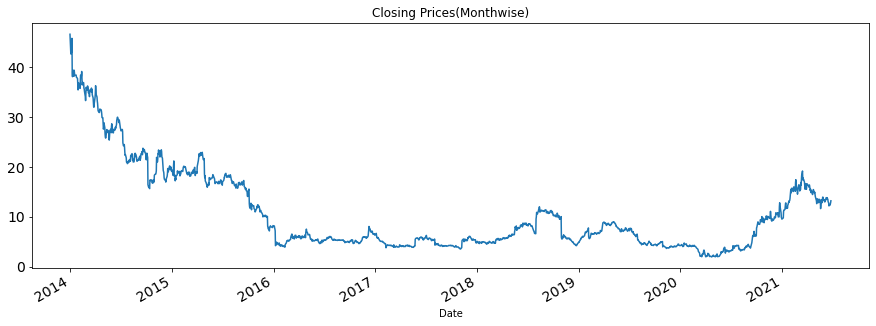

In [8]:
temp=df.groupby(['Date'])['Close'].mean() 
temp.plot(figsize=(15,5), title= 'Closing Prices(Monthwise)', fontsize=14)

In [9]:
fig = px.bar(df, x = 'Date',y ='Volume', color = 'Close', title = 'Volume of  price and years')
fig.show()

In [10]:
fig = go.Figure(data=[go.Candlestick(x=df['Date'],
                open=df['Open'], high=df['High'],
                low=df['Low'], close=df['Close'],increasing_line_color= 'midnightblue', decreasing_line_color= 'teal')
                     ])

fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

In [11]:
def interactive_plot(df,title):
    fig = px.line(title = title)
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i], name = i)
    fig.show()

In [12]:
interactive_plot(df,'The Stocks from  years')

# Normalization

The purpose of normalization is to eliminate such anomalies and provide accurate historical information that enables reliable comparisons and forecasting.

In [13]:
def normalization(df):
    x = df.copy()
    for i in x.columns[1:]:
        x[i] = x[i]/x[i][0]
    return x

In [14]:
interactive_plot(normalization(df),'The Stocks after Anomaliess')

In [15]:
normalization(df)

,Date,High,Low,Open,Close,Volume,Adj Close
0,2013-12-31,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2014-01-02,0.995751,0.960088,1.012530,0.939283,1.733507,0.939283
2,2014-01-03,0.959847,0.916228,0.967596,0.915254,2.706814,0.915254
3,2014-01-06,0.956023,0.937719,0.965003,0.922120,2.389974,0.922120
4,2014-01-07,0.972806,0.945614,0.947073,0.982407,3.639974,0.982407
...,...,...,...,...,...,...,...
1880,2021-06-21,0.268324,0.268860,0.267012,0.266252,1.277778,0.284828
1881,2021-06-22,0.265349,0.264035,0.268092,0.265394,1.474175,0.283910
1882,2021-06-23,0.269811,0.270395,0.267444,0.270328,0.779514,0.289188
1883,2021-06-24,0.280221,0.276974,0.276950,0.275692,1.560981,0.294926


In [16]:
dff = normalization(df)

In [17]:
def daily_return(df):
    df_daily_return = df.copy()
    for i in df.columns[1:]:
        for j in range(1,len(df)):
         # Calculate the percentage of change from the previous day
            df_daily_return[i][j] = ((df[i][j]- df[i][j-1])/df[i][j-1])*100
        df_daily_return[i][0]=0
    return df_daily_return

In [18]:
daily_return(df)

,Date,High,Low,Open,Close,Volume,Adj Close
0,2013-12-31,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2014-01-02,-0.424901,-3.991228,1.252966,-6.071662,73.350694,-6.071660
2,2014-01-03,-3.605715,-4.568296,-4.437803,-2.558243,56.146720,-2.558242
3,2014-01-06,-0.398407,2.345619,-0.267923,0.750116,-11.705283,0.750115
4,2014-01-07,1.755558,0.841910,-1.858066,6.537928,52.301825,6.537926
...,...,...,...,...,...,...,...
1880,2021-06-21,-0.785541,1.322313,-1.748810,1.721312,-35.565769,1.721312
1881,2021-06-22,-1.108475,-1.794456,0.404532,-0.322320,15.370245,-0.322320
1882,2021-06-23,1.681345,2.408638,-0.241738,1.859341,-47.122037,1.859341
1883,2021-06-24,3.858266,2.433092,3.554116,1.984127,100.250557,1.984127


In [19]:
stocks_daily_return = daily_return(df)
stocks_daily_return

,Date,High,Low,Open,Close,Volume,Adj Close
0,2013-12-31,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2014-01-02,-0.424901,-3.991228,1.252966,-6.071662,73.350694,-6.071660
2,2014-01-03,-3.605715,-4.568296,-4.437803,-2.558243,56.146720,-2.558242
3,2014-01-06,-0.398407,2.345619,-0.267923,0.750116,-11.705283,0.750115
4,2014-01-07,1.755558,0.841910,-1.858066,6.537928,52.301825,6.537926
...,...,...,...,...,...,...,...
1880,2021-06-21,-0.785541,1.322313,-1.748810,1.721312,-35.565769,1.721312
1881,2021-06-22,-1.108475,-1.794456,0.404532,-0.322320,15.370245,-0.322320
1882,2021-06-23,1.681345,2.408638,-0.241738,1.859341,-47.122037,1.859341
1883,2021-06-24,3.858266,2.433092,3.554116,1.984127,100.250557,1.984127


In [20]:
interactive_plot(daily_return(df),'The Stockson daily returns')

<AxesSubplot:xlabel='Date', ylabel='Close'>

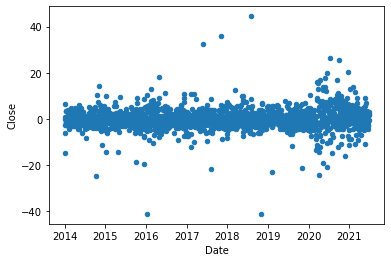

In [21]:
stocks_daily_return.plot(kind = 'scatter', x = 'Date',y = 'Close')

<AxesSubplot:xlabel='Date', ylabel='Volume'>

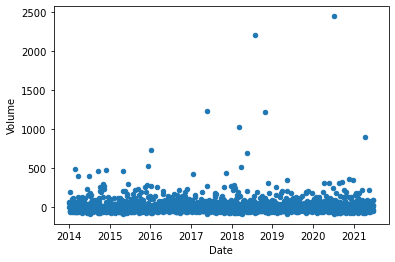

In [22]:
stocks_daily_return.plot(kind = 'scatter', x = 'Date',y = 'Volume')

<AxesSubplot:xlabel='Date', ylabel='High'>

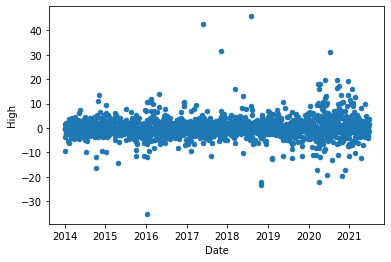

In [23]:
stocks_daily_return.plot(kind = 'scatter', x = 'Date',y = 'High')

<AxesSubplot:xlabel='Date'>

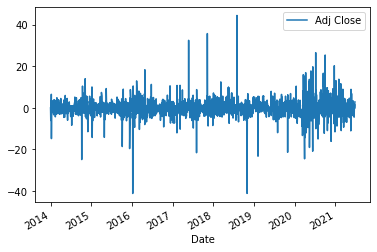

In [24]:
stocks_daily_return.plot(kind = 'line', x = 'Date',y = 'Adj Close')

# MOVING AVAERAGE

The most common applications of moving averages are to identify the trending direction and determine support and resistance levels. ... As the stock price changes, its average price moves up or down. Let's take a look at this indicator and how it can help traders follow trends to make higher profits.

In [25]:
moving_average_df = df.copy()
for i in moving_average_df.columns[1:]:
    moving_average_df[i] = df[i].rolling(21).mean()

In [26]:
fig = go.Figure(data=[go.Candlestick(x=moving_average_df ['Date'],
                open=moving_average_df ['Open'], high=moving_average_df ['High'],
                low=moving_average_df ['Low'], close=moving_average_df ['Close'],increasing_line_color= 'midnightblue', decreasing_line_color= 'teal')
                     ])

fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

In [27]:
moving_average_df

,Date,High,Low,Open,Close,Volume,Adj Close
0,2013-12-31,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-01-02,NaN,NaN,NaN,NaN,NaN,NaN
2,2014-01-03,NaN,NaN,NaN,NaN,NaN,NaN
3,2014-01-06,NaN,NaN,NaN,NaN,NaN,NaN
4,2014-01-07,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
1880,2021-06-21,13.572857,13.005714,13.333809,13.271429,735980.952381,13.271429
1881,2021-06-22,13.512381,12.971905,13.306190,13.221429,677609.523810,13.221429
1882,2021-06-23,13.474286,12.961429,13.253333,13.210000,646980.952381,13.210000
1883,2021-06-24,13.468571,12.950476,13.246667,13.207619,637285.714286,13.207619


In [28]:
for i in df.columns[1:]:
    fig = px.line(x = df.Date[20:],y = df[i][20:],  title =  i + ' Original Stock Price vs. 21-days Moving Average change')
    fig.add_scatter(x = moving_average_df.Date[20:], y = moving_average_df[i][20:])
    fig.show()

In [29]:
signal = df.copy()
for i in range(len(df)):
    for j in df.columns[1:]:
        if df[j][i]>moving_average_df[j][i]:
            signal[j][i] = 1
        if df[j][i] < moving_average_df[j][i]:
            signal[j][i] = -1
            

In [30]:
signal[21:]

,Date,High,Low,Open,Close,Volume,Adj Close
21,2014-01-31,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
22,2014-02-03,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
23,2014-02-04,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
24,2014-02-05,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
25,2014-02-06,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...
1880,2021-06-21,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
1881,2021-06-22,-1.0,-1.0,-1.0,-1.0,1.0,-1.0
1882,2021-06-23,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
1883,2021-06-24,-1.0,-1.0,-1.0,-1.0,1.0,-1.0


In [31]:
company_list = [df]
company_name = ['TCS']

for company, com_name in zip(company_list, company_name):
    company["company_name"] = com_name
    
data = pd.concat(company_list, axis=0)
data.head()

,Date,High,Low,Open,Close,Volume,Adj Close,company_name
0,2013-12-31,47.070000,45.599998,46.290001,46.610001,460800.0,43.570217,TCS
1,2014-01-02,46.869999,43.779999,46.869999,43.779999,798800.0,40.924782,TCS
2,2014-01-03,45.180000,41.779999,44.790001,42.660000,1247300.0,39.877827,TCS
3,2014-01-06,45.000000,42.759998,44.669998,42.980000,1101300.0,40.176956,TCS
4,2014-01-07,45.790001,43.119999,43.840000,45.790001,1677300.0,42.803696,TCS


In [32]:
ma_day = [10, 20, 50]

for ma in ma_day:
    for company in company_list:
        column_name = f"MA for {ma} days"
        company[column_name] = company['Adj Close'].rolling(ma).mean()

<AxesSubplot:>

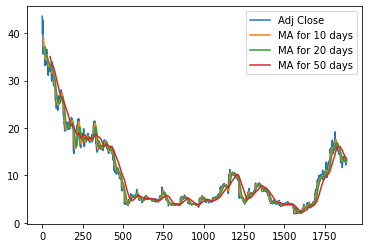

In [33]:
df[['Adj Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot()

C:\Users\HI\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<Figure size 864x864 with 0 Axes>

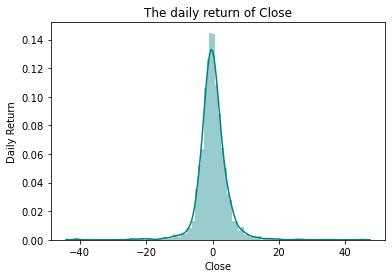

<Figure size 864x864 with 0 Axes>

In [34]:
sns.distplot(stocks_daily_return['Close'].dropna(), bins = 100, color ='Teal')
sns.color_palette("mako")
plt.ylabel('Daily Return')
plt.title('The daily return of Close')
plt.figure(figsize=(12, 12))

C:\Users\HI\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<Figure size 864x864 with 0 Axes>

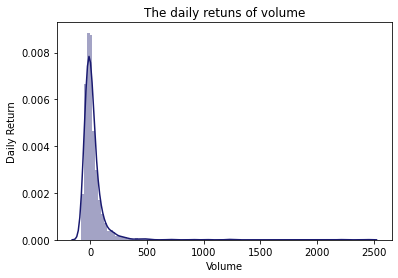

<Figure size 864x864 with 0 Axes>

In [35]:
sns.distplot(stocks_daily_return['Volume'].dropna(), bins = 100, color ='MidnightBlue')
sns.color_palette("rainbow")
plt.ylabel('Daily Return')
plt.title('The daily retuns of volume')
plt.figure(figsize=(12, 12))

C:\Users\HI\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<Figure size 864x864 with 0 Axes>

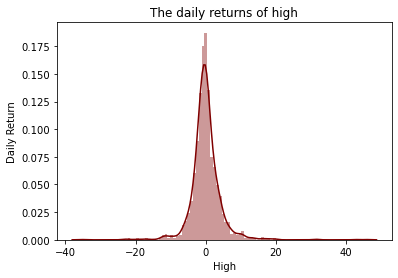

<Figure size 864x864 with 0 Axes>

In [36]:
sns.distplot(stocks_daily_return['High'].dropna(), bins = 100, color ='Maroon')
sns.color_palette("rainbow")
plt.ylabel('Daily Return')
plt.title('The daily returns of high')
plt.figure(figsize=(12, 12))

In [37]:
fig = px.line(df, x='Date', y='Volume',title='STOCKS DURING LOCKDOWN',range_x=['2020-01-01','2022-01-01'])
fig.update_layout(
            shapes=[
                    dict(
                        type="rect",
                        xref="x",
                        yref="paper",
                        x0="2020-03-25", 

                        y0=0,
                        x1="2020-05-31",
                        y1=1,
                        fillcolor="midnightblue",
                        opacity=0.5,
                        layer="below",
                        line_width=0,
                        ),
                    
                # Second phase Lockdown
                dict(
                    type="rect",
                    xref="x",
                    yref="paper",
                    x0="2021-02-10",
                    y0=0,
                    x1="2021-06-20",
                    y1=1,
                    fillcolor="mediumpurple",
                    opacity=0.5,
                    layer="below",
                    line_width=0,)],
              
              
annotations=[dict(x='2020-03-19', y=0.99, xref='x', yref='paper',showarrow=False, xanchor='right', text='Phase 1 '),
             dict(x='2021-01-01', y=0.99, xref='x', yref='paper', showarrow=False, xanchor='right', text='Phase 2 ')
             ])
fig.show()

# Capital Asset Pricing Model (CAPM)

The Capital Asset Pricing Model (CAPM) describes the relationship between systematic risk and expected return for assets, particularly stocks. CAPM is widely used throughout finance for pricing risky securities and generating expected returns for assets given the risk of those assets and cost of capital

#"E(ri) = rf+ βi(rm - rf)" is the formulae for CAPM

In [38]:
#ri = Expected_return_Security
#rf = riskfree rate of return
#β  = β between stock and market
#rm = risk premium (incentive for investing in a risk security)

In [39]:
#Applying CAPM MODEL

In [40]:
#lets assume 
beta = 1.11

In [41]:
stocks_daily_return['Adj Close'].mean()

0.04420937493929024

In [42]:
rm = stocks_daily_return['Adj Close'].mean()*252
rm

11.14076248470114

In [43]:
rm

11.14076248470114

In [44]:
# Assume risk free rate is zero
# Also you can use the yield of a 10-years U.S. Government bond as a risk free rate
rf = 0 

# Calculate return for any security (APPL) using CAPM  
Expected_return_Security = rf + ( beta * (rm-rf) ) 

In [45]:
Expected_return_Security

12.366246358018266

# PORTFOLIO ALLOCATION

It aims to maximize returns by investing in different areas that would each react differently to the same event

A portfolio investment may be either strategic—where you buy financial assets with the intention of holding onto those assets for a long time; or tactical—where you actively buy and sell the asset hoping to achieve short-term gains.

In [46]:
# Let's create random portfolio weights
# Portfolio weights must sum to 1 
np.random.seed()
weights = np.array(np.random.random(6))

In [47]:
weights = weights/np.sum(weights)

In [48]:
weights

array([0.12114532, 0.18117779, 0.19922531, 0.15714275, 0.13454235,
       0.20676648])

In [49]:
df_portfolio = dff


In [50]:
df_portfolio

,Date,High,Low,Open,Close,Volume,Adj Close
0,2013-12-31,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2014-01-02,0.995751,0.960088,1.012530,0.939283,1.733507,0.939283
2,2014-01-03,0.959847,0.916228,0.967596,0.915254,2.706814,0.915254
3,2014-01-06,0.956023,0.937719,0.965003,0.922120,2.389974,0.922120
4,2014-01-07,0.972806,0.945614,0.947073,0.982407,3.639974,0.982407
...,...,...,...,...,...,...,...
1880,2021-06-21,0.268324,0.268860,0.267012,0.266252,1.277778,0.284828
1881,2021-06-22,0.265349,0.264035,0.268092,0.265394,1.474175,0.283910
1882,2021-06-23,0.269811,0.270395,0.267444,0.270328,0.779514,0.289188
1883,2021-06-24,0.280221,0.276974,0.276950,0.275692,1.560981,0.294926


In [51]:
df_portfolio.columns[1:]

Index(['High', 'Low', 'Open', 'Close', 'Volume', 'Adj Close'], dtype='object')

In [52]:
for i,stock  in enumerate(df_portfolio.columns[1:]):
    df_portfolio[stock] = df_portfolio[stock]* weights[i]
    df_portfolio[stock] = df_portfolio[stock] * 1000000

In [53]:
df_portfolio[stock]

0       206766.479190
1       194212.322113
2       189243.900197
3       190663.446730
4       203128.881017
            ...      
1880     58892.797513
1881     58702.974010
1882     59794.462551
1883     60980.860582
1884     62736.729124
Name: Adj Close, Length: 1885, dtype: float64

In [54]:
df_portfolio['Portfolio in rupess'] = df_portfolio[df_portfolio[stock] != 'Date'].sum(axis =1)

In [55]:
df_portfolio

,Date,High,Low,Open,Close,Volume,Adj Close,Portfolio in rupess
0,2013-12-31,121145.321333,181177.786829,199225.307580,157142.753669,134542.351399,206766.479190,1.000000e+06
1,2014-01-02,120630.574002,173946.569115,201721.533134,147601.576351,233230.100472,194212.322113,1.071343e+06
2,2014-01-03,116280.979185,166000.174690,192769.529756,143825.568757,364181.152127,189243.900197,1.172301e+06
3,2014-01-06,115817.707570,169893.906139,192253.055709,144904.428069,321552.716137,190663.446730,1.135085e+06
4,2014-01-07,117850.954126,171324.259561,188680.867184,154378.175073,489730.655386,203128.881017,1.325094e+06
...,...,...,...,...,...,...,...,...
1880,2021-06-21,32506.170219,48711.398735,53195.607790,41839.552103,171915.226788,58892.797513,4.070608e+05
1881,2021-06-22,32145.847579,47837.294287,53410.801205,41704.694689,198339.017590,58702.974010,4.321406e+05
1882,2021-06-23,32686.330312,48989.521327,53281.686798,42480.127231,104877.631559,59794.462551,3.421098e+05
1883,2021-06-24,33947.455872,50181.481249,55175.379820,43322.986873,210018.041149,60980.860582,4.536262e+05


In [56]:
#Portfolio in rupees in daily_returns

In [57]:
df_portfolio['daily_returns'] = 0.000

In [58]:
for i in range(1,len(df_portfolio)):
    df_portfolio['daily_returns'][i] = ((df_portfolio['Portfolio in rupess'][i]-df_portfolio['Portfolio in rupess'][i-1])/df_portfolio['Portfolio in rupess'][i-1])*100

In [59]:
df_portfolio 

,Date,High,Low,Open,Close,Volume,Adj Close,Portfolio in rupess,daily_returns
0,2013-12-31,121145.321333,181177.786829,199225.307580,157142.753669,134542.351399,206766.479190,1.000000e+06,0.000000
1,2014-01-02,120630.574002,173946.569115,201721.533134,147601.576351,233230.100472,194212.322113,1.071343e+06,7.134268
2,2014-01-03,116280.979185,166000.174690,192769.529756,143825.568757,364181.152127,189243.900197,1.172301e+06,9.423561
3,2014-01-06,115817.707570,169893.906139,192253.055709,144904.428069,321552.716137,190663.446730,1.135085e+06,-3.174614
4,2014-01-07,117850.954126,171324.259561,188680.867184,154378.175073,489730.655386,203128.881017,1.325094e+06,16.739582
...,...,...,...,...,...,...,...,...,...
1880,2021-06-21,32506.170219,48711.398735,53195.607790,41839.552103,171915.226788,58892.797513,4.070608e+05,-18.720620
1881,2021-06-22,32145.847579,47837.294287,53410.801205,41704.694689,198339.017590,58702.974010,4.321406e+05,6.161212
1882,2021-06-23,32686.330312,48989.521327,53281.686798,42480.127231,104877.631559,59794.462551,3.421098e+05,-20.833697
1883,2021-06-24,33947.455872,50181.481249,55175.379820,43322.986873,210018.041149,60980.860582,4.536262e+05,32.596686


In [60]:
interactive_plot(df_portfolio, title = 'Portfolio in TillDate' )

# SHARPE RATIO

the ratio is the average return earned in excess of the risk-free rate per unit of volatility or total risk.

The Formula for the Sharpe Ratio Is

In [61]:
sharpe_ratio = ((df_portfolio['daily_returns'].mean()-rf)/df_portfolio['daily_returns'].std())* np.sqrt(252)

In [62]:
sharpe_ratio

1.4552545043074112

In [63]:
rol_mean = df['Close'].rolling(window = 12, center = False).mean()
rol_std = df['Close'].rolling(window = 12, center = False).std()



Text(0.5, 1.0, 'Rolling Mean & Standard Deviation')

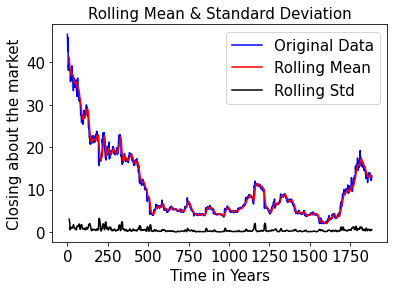

In [64]:
plt.plot(figsize =(150,30))
plt.plot(df['Close'], color = 'blue',label = 'Original Data')
plt.plot(rol_mean, color = 'red', label = 'Rolling Mean')
plt.plot(rol_std, color ='black', label = 'Rolling Std')
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Time in Years', fontsize = 15)
plt.ylabel('Closing about the market', fontsize = 15)
plt.legend(loc='best', fontsize = 15)
plt.title('Rolling Mean & Standard Deviation', fontsize = 15)

In [65]:

from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.stattools import adfuller
from pmdarima import auto_arima

In [66]:
# Ho: Non-Stationary
#H1 Stationary

In [67]:
def adfuller_test(close):
    result=adfuller(close)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Indicating it is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")
    

In [68]:
adfuller_test(df['Close'])

ADF Test Statistic : -4.9868299328854135
p-value : 2.3564379318572534e-05
#Lags Used : 0
Number of Observations Used : 1884
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Indicating it is stationary


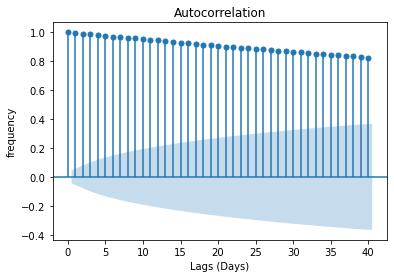

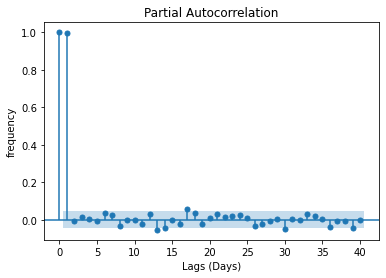

In [69]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(df['Close'].iloc[13:],lags=40)
plt.xlabel('Lags (Days)')
plt.ylabel('frequency')
plot_pacf(df['Close'].iloc[13:],lags=40)
plt.xlabel('Lags (Days)')
plt.ylabel('frequency')
plt.show()
plt.show()

In [70]:
df['Close of first difference'] = df['Close'] - df['Close'].shift(1)

In [71]:
adfuller_test(df['Close of first difference'].dropna())

ADF Test Statistic : -44.61726760547535
p-value : 0.0
#Lags Used : 0
Number of Observations Used : 1883
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Indicating it is stationary


<AxesSubplot:>

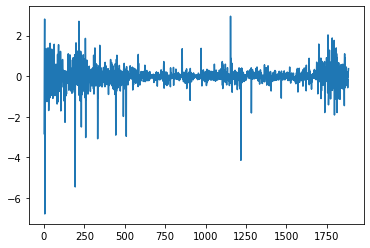

In [72]:
df['Close of first difference'].plot()

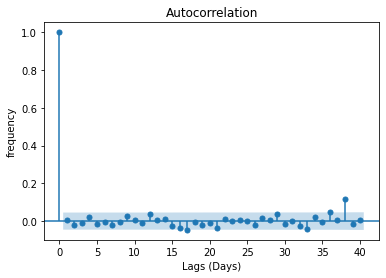

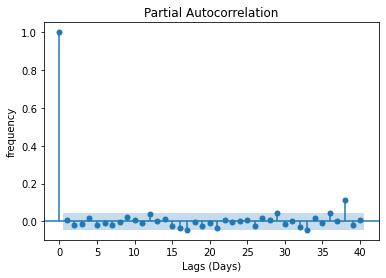

In [73]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(df['Close of first difference'].iloc[13:],lags=40)
plt.xlabel('Lags (Days)')
plt.ylabel('frequency')
plot_pacf(df['Close of first difference'].iloc[13:],lags=40)
plt.xlabel('Lags (Days)')
plt.ylabel('frequency')
plt.show()

In [74]:
train = df[df.Date < '2020']
test = df[df.Date > '2020']

In [75]:
model = auto_arima(train['Close'],order= (4,2,0))


C:\Users\HI\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [76]:
model_fit = model.fit(train['Close'])

In [77]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1511
Model:               SARIMAX(5, 2, 0)   Log Likelihood               -1192.435
Date:                Mon, 28 Jun 2021   AIC                           2396.870
Time:                        15:05:58   BIC                           2428.786
Sample:                             0   HQIC                          2408.756
                               - 1511                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8548      0.012    -68.976      0.000      -0.879      -0.831
ar.L2         -0.7422      0.016    -46.509      0.000      -0.774      -0.711
ar.L3         -0.5637      0.019    -29.527      0.000      -0.601      -0.526
ar.L4         -0.3221      0.020    -16.327      0.000      -0.361      -0.283
ar.L5         -0.2051      0.015    -13.362      0.000      -0.235      -0.175
sigma2         0.2842      0.003     85.464      0.000       0.278       0.291
===================================================================================
Ljung-Box (L1) (Q):                   0.33   Jarque-Bera (JB):             45586.21
Prob(Q):                              0.56   Prob(JB):                         0.00
Heteroskedasticity (H):               0.19   Skew:                            -1.87
Prob(H) (two-sided):                  0.00   Kurtosis:                        29.66
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [78]:
test['Prediction']=model.predict(n_periods=len(test))


<AxesSubplot:>

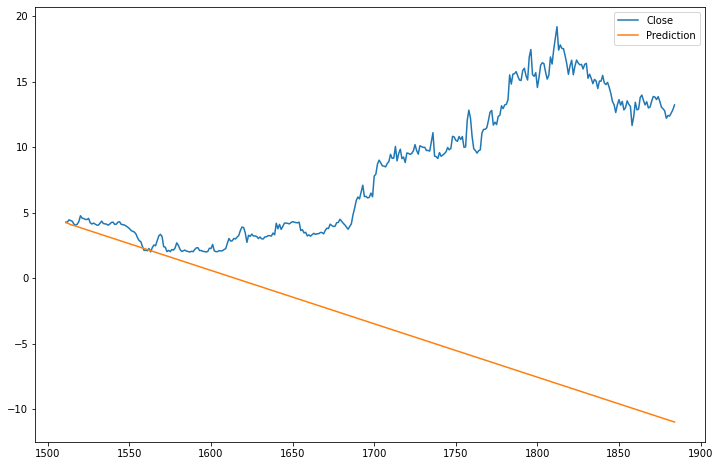

In [79]:
test[['Close','Prediction']].plot(figsize=(12,8))

In [80]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [81]:
print('MAE :', mean_absolute_error(test.Close,test.Prediction))
print('RMSE :', np.sqrt(mean_absolute_error(test.Close,test.Prediction)))

MAE : 11.49353180827943
RMSE : 3.390211174584768


In [82]:
# Forecasting the Next Year Stocks

In [83]:
from fbprophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric

In [84]:
fmodel = Prophet()
fmodel.fit(df[['Date','Close']].rename(columns = {"Date":'ds','Close':"y"}))
df_future = fmodel.make_future_dataframe(periods=365)


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [85]:
df_future.tail()

,ds
2245,2022-06-21
2246,2022-06-22
2247,2022-06-23
2248,2022-06-24
2249,2022-06-25


In [86]:
df_prd = fmodel.predict(df_future)

In [87]:
df_prd

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-12-31,41.073471,38.041553,42.380551,41.073471,41.073471,-0.726036,-0.726036,-0.726036,-1.023372,-1.023372,-1.023372,0.297337,0.297337,0.297337,0.0,0.0,0.0,40.347435
1,2014-01-02,40.912843,38.059934,42.256793,40.912843,40.912843,-0.782184,-0.782184,-0.782184,-1.049575,-1.049575,-1.049575,0.267391,0.267391,0.267391,0.0,0.0,0.0,40.130659
2,2014-01-03,40.832529,37.953389,42.041526,40.832529,40.832529,-0.782949,-0.782949,-0.782949,-1.025512,-1.025512,-1.025512,0.242563,0.242563,0.242563,0.0,0.0,0.0,40.049581
3,2014-01-06,40.591588,37.576640,41.759511,40.591588,40.591588,-0.909652,-0.909652,-0.909652,-1.044019,-1.044019,-1.044019,0.134367,0.134367,0.134367,0.0,0.0,0.0,39.681936
4,2014-01-07,40.511274,37.471524,41.589096,40.511274,40.511274,-0.933902,-0.933902,-0.933902,-1.023372,-1.023372,-1.023372,0.089471,0.089471,0.089471,0.0,0.0,0.0,39.577372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2245,2022-06-21,25.378610,17.194146,31.570985,18.486816,32.485349,-1.126873,-1.126873,-1.126873,-1.023372,-1.023372,-1.023372,-0.103501,-0.103501,-0.103501,0.0,0.0,0.0,24.251738
2246,2022-06-22,25.403822,16.905904,31.601554,18.490098,32.575876,-1.173837,-1.173837,-1.173837,-1.106650,-1.106650,-1.106650,-0.067186,-0.067186,-0.067186,0.0,0.0,0.0,24.229985
2247,2022-06-23,25.429033,17.124559,31.963584,18.493380,32.666681,-1.079153,-1.079153,-1.079153,-1.049575,-1.049575,-1.049575,-0.029578,-0.029578,-0.029578,0.0,0.0,0.0,24.349881
2248,2022-06-24,25.454245,17.246390,31.932529,18.496662,32.758609,-1.016951,-1.016951,-1.016951,-1.025512,-1.025512,-1.025512,0.008562,0.008562,0.008562,0.0,0.0,0.0,24.437294


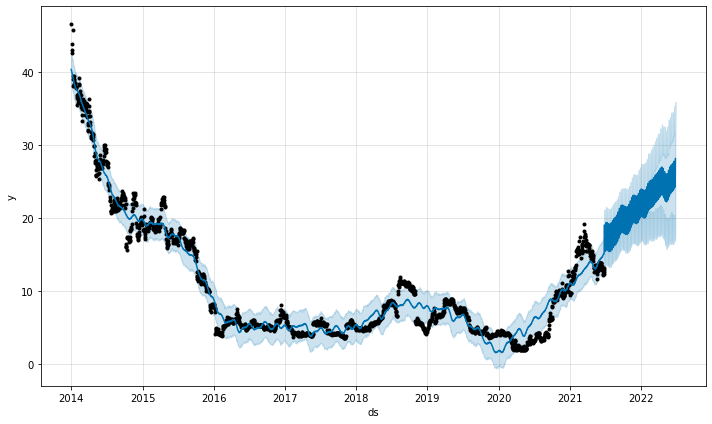

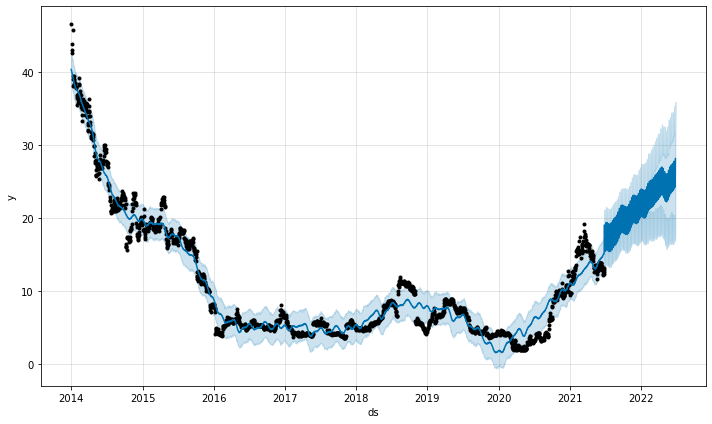

In [88]:
fmodel.plot(df_prd)

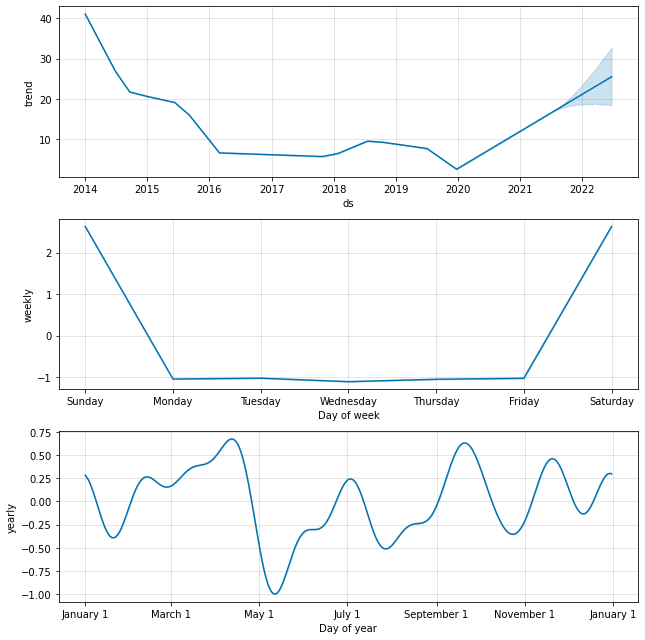

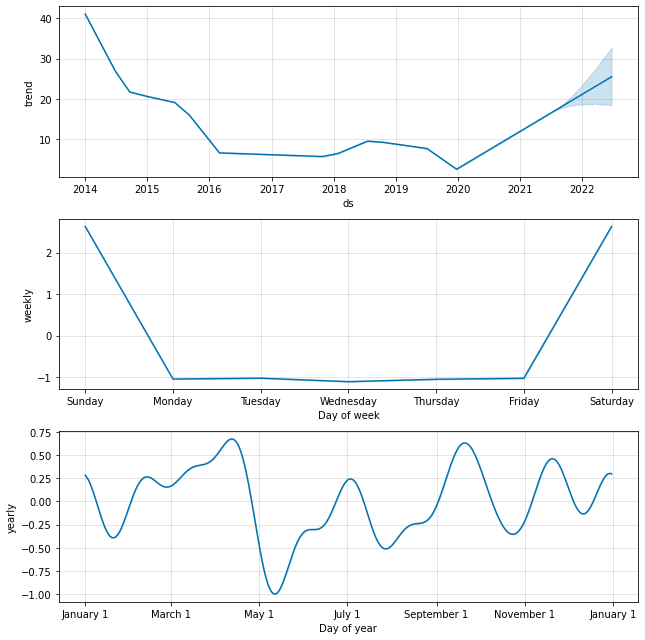

In [89]:
fmodel.plot_components(df_prd)